In [ ]:
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
import cv2
from PIL import Image
import os
import glob as gb

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.optim import Adam , lr_scheduler
import torchvision
from torchvision import datasets
import torchvision.transforms as transforms
from torchvision.transforms import ToTensor
from torch.utils.data import DataLoader
from torch.utils.data import Dataset

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Loading Dataset

In [ ]:
from google.colab import files
uploaded = files.upload()
for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))
!mkdir -p ~/.kaggle/ && mv kaggle.json ~/.kaggle/ && chmod 600 ~/.kaggle/kaggle.json

Saving kaggle.json to kaggle.json
User uploaded file "kaggle.json" with length 66 bytes


In [ ]:
!kaggle datasets download -d andrewmvd/lung-and-colon-cancer-histopathological-images

Dataset URL: https://www.kaggle.com/datasets/andrewmvd/lung-and-colon-cancer-histopathological-images
License(s): CC-BY-SA-4.0
100% 1.75G/1.76G [00:14<00:00, 276MB/s]
100% 1.76G/1.76G [00:14<00:00, 129MB/s]


In [ ]:
!unzip lung-and-colon-cancer-histopathological-images.zip -d /content/lung_colon_image_set

Archive:  lung-and-colon-cancer-histopathological-images.zip
replace /content/lung_colon_image_set/lung_colon_image_set/colon_image_sets/colon_aca/colonca1.jpeg? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [ ]:
!pip install tqdm # Install the tqdm library

from tqdm import tqdm # Import the tqdm function

def walk_through_data(dir_path):  # "walk_through_data" that takes a directory path as input
    for dirpath, dirnames, filenames in tqdm(os.walk(dir_path)):
        print(f"There are {len(dirnames)} directions and {len(filenames)} images in {dirpath}")

dataset_path = data_dir = '/content/lung_colon_image_set/lung_colon_image_set'
walk_through_data(dataset_path)

8it [00:00, 327.45it/s]

There are 2 directions and 0 images in /content/lung_colon_image_set/lung_colon_image_set
There are 3 directions and 0 images in /content/lung_colon_image_set/lung_colon_image_set/lung_image_sets
There are 0 directions and 5000 images in /content/lung_colon_image_set/lung_colon_image_set/lung_image_sets/lung_scc
There are 0 directions and 5000 images in /content/lung_colon_image_set/lung_colon_image_set/lung_image_sets/lung_aca
There are 0 directions and 5000 images in /content/lung_colon_image_set/lung_colon_image_set/lung_image_sets/lung_n
There are 2 directions and 0 images in /content/lung_colon_image_set/lung_colon_image_set/colon_image_sets
There are 0 directions and 5000 images in /content/lung_colon_image_set/lung_colon_image_set/colon_image_sets/colon_n
There are 0 directions and 5000 images in /content/lung_colon_image_set/lung_colon_image_set/colon_image_sets/colon_aca


In [ ]:
dataset_path=data_dir = '/content/lung_colon_image_set/lung_colon_image_set'

In [ ]:
walk_through_data(dataset_path)

8it [00:00, 362.86it/s]

There are 2 directions and 0 images in /content/lung_colon_image_set/lung_colon_image_set
There are 3 directions and 0 images in /content/lung_colon_image_set/lung_colon_image_set/lung_image_sets
There are 0 directions and 5000 images in /content/lung_colon_image_set/lung_colon_image_set/lung_image_sets/lung_scc
There are 0 directions and 5000 images in /content/lung_colon_image_set/lung_colon_image_set/lung_image_sets/lung_aca
There are 0 directions and 5000 images in /content/lung_colon_image_set/lung_colon_image_set/lung_image_sets/lung_n
There are 2 directions and 0 images in /content/lung_colon_image_set/lung_colon_image_set/colon_image_sets
There are 0 directions and 5000 images in /content/lung_colon_image_set/lung_colon_image_set/colon_image_sets/colon_n
There are 0 directions and 5000 images in /content/lung_colon_image_set/lung_colon_image_set/colon_image_sets/colon_aca


In [ ]:
extension=[]
for cat in tqdm(os.listdir(dataset_path)) :
    for folder in os.listdir(dataset_path + "/" + cat) :
        for file in os.listdir(dataset_path + "/" + cat + "/" + folder + "/") :
            if os.path.isfile(dataset_path + "/" + cat + "/" + folder + "/" + file) :
                extension.append(os.path.splitext(file)[1])

#Creating a list of all the file extensions present in the dataset_path directory
#If the file is a regular file (not a directory), the file extension is extracted using os.path.splitext(file)[1] and appended to the extension list.

100%|██████████| 2/2 [00:00<00:00,  6.16it/s]


In [ ]:
#check if all the files are of the desired format
print(len(extension),np.unique(extension))

25000 ['.jpeg']


In [ ]:
#creating two lists: categories and classes
categories=[]
classes=[]
for cat in tqdm(os.listdir(dataset_path)) :
    if cat not in categories :
        categories.append(cat.replace('_image_sets',''))

    for folder in os.listdir(dataset_path + "/" + cat) :
        if folder not in classes :
            classes.append(folder)

100%|██████████| 2/2 [00:00<00:00, 13005.59it/s]


In [ ]:
categories

['lung', 'colon']

In [ ]:
classes

['lung_scc', 'lung_aca', 'lung_n', 'colon_n', 'colon_aca']

In [ ]:
#map image classes to numerical labels
img_label={}
for key in categories :
    dic={}
    for value in classes :
        if key in value :
            dic[value]=classes.index(value)
    img_label[key]=dic

In [ ]:
img_label

{'lung': {'lung_scc': 0, 'lung_aca': 1, 'lung_n': 2},
 'colon': {'colon_n': 3, 'colon_aca': 4}}

In [ ]:
def getlabel(n) :
    for i , j in img_label.items() :
        for x , y in j.items() :
            if n==y :
                return i , x  #it returns a tuple containing the category

In [ ]:
getlabel(1)

('lung', 'lung_aca')

In [ ]:
dataset_path_list=[]  #This list will eventually contain the paths to all the images in the dataset
dataset_labels=[]     #for each image file, this list will contain its corresponding label
for cat in tqdm(os.listdir(dataset_path)) :
    for folder in os.listdir(dataset_path + "/" + cat) :
        files=gb.glob(pathname = str(dataset_path + "/" + cat + "/" + folder + "/*.jpeg"))
        for file in files :
            dataset_path_list.append(file)
            dataset_labels.append(img_label[cat.replace('_image_sets','')][folder])

100%|██████████| 2/2 [00:00<00:00, 31.47it/s]


In [ ]:
len(dataset_path_list) , len(dataset_labels)

(25000, 25000)

In [ ]:
np.unique(dataset_labels)

array([0, 1, 2, 3, 4])

In [ ]:
# defining a variable to resize images in the dataset to 250x250 pixels
img_size=250

In [ ]:
#resizing all images from the dataset and storing them in dataset_images
dataset_images=[]
for cat in tqdm(os.listdir(dataset_path)) :
    for folder in os.listdir(dataset_path + "/" + cat) :
        files=gb.glob(pathname = str(dataset_path + "/" + cat + "/" + folder + "/*.jpeg"))
        for file in files :
            img=cv2.imread(file)
            img=cv2.resize(img,(img_size,img_size))
            dataset_images.append(list(img))

100%|██████████| 2/2 [01:25<00:00, 42.93s/it]


In [ ]:
print(np.array(dataset_images).shape)

(25000, 250, 250, 3)


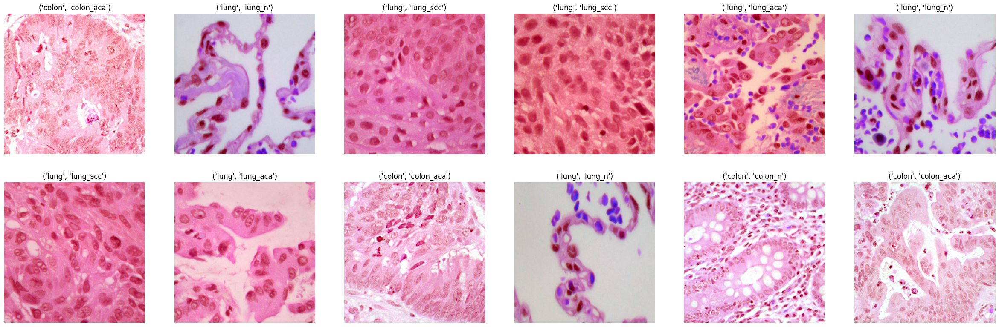

In [ ]:
#visualizating a random selection of images
plt.figure(figsize=(30,30))
for n , i in enumerate(list(np.random.randint(0,len(dataset_images),12))):
    plt.subplot(6,6,n+1)
    plt.imshow(dataset_images[i])
    plt.axis('off')
    plt.title(getlabel(dataset_labels[i]))

# Split dataset

In [ ]:
train_path_list , test_path_list , train_labels , test_labels = train_test_split(dataset_path_list , dataset_labels , train_size=0.80 , random_state=0)

In [ ]:
print(f"The size of the training set is : {len(train_path_list)}")
print(f"The size of the testing set is : {len(test_path_list)}")

The size of the training set is : 20000
The size of the testing set is : 5000


# Gettting images into tensors

In [ ]:
#image transformation pipeline using PyTorch's transforms.Compose
basic_transform=transforms.Compose([
     transforms.Resize(size=(img_size,img_size)) ,
     transforms.ToTensor()
 ])

In [ ]:
#Checking a mismatch between the number of image paths and the number of corresponding labels
class InvalidDatasetException(Exception):

    def __init__(self,len_of_paths,len_of_labels):
        super().__init__(
            f"Number of paths ({len_of_paths}) is not compatible with number of labels ({len_of_labels})"
        )

In [1]:
#class is designed to handle image data and their corresponding labels for training a machine learning model

class train_data(Dataset) :
    def __init__(self,train_path , train_label , transform_method) :
        self.train_path=train_path
        self.train_label=train_label
        self.transform_method = transform_method
        if len(self.train_path) != len(self.train_label):
            raise InvalidDatasetException(self.train_path,self.train_label)


    def __len__(self) :
        return len(self.train_path)


    def __getitem__(self,index) :
        image=Image.open(self.train_path[index])
        tensor_image=self.transform_method(image)
        label=self.train_label[index]

        return tensor_image , label

NameError: name 'Dataset' is not defined

In [ ]:
train_set = train_data(train_path_list , train_labels , basic_transform)

In [ ]:
np.unique(train_set.train_label)

array([0, 1, 2, 3, 4])

In [ ]:
train_set.__len__()

20000

In [ ]:
filer_train_image=train_set.__getitem__(1000)

In [ ]:
filer_train_image[0].shape

torch.Size([3, 250, 250])

In [ ]:
getlabel(filer_train_image[1])

('lung', 'lung_aca')

In [ ]:
class test_data(Dataset) :
    def __init__(self,test_path , test_label , transform_method) :
        self.test_path = test_path
        self.test_label = test_label
        self.transform_method = transform_method
        if len(self.test_path) != len(self.test_label):
            raise InvalidDatasetException(self.test_path,self.test_label)


    def __len__(self) :
        return len(self.test_path)


    def __getitem__(self,index) :
        image=Image.open(self.test_path[index])
        tensor_image = self.transform_method(image)
        label=self.test_label[index]

        return tensor_image , label

In [ ]:
test_set = test_data(test_path_list , test_labels , basic_transform)

In [ ]:
np.unique(test_set.test_label)


array([0, 1, 2, 3, 4])

In [ ]:
test_set.__len__()

5000

In [ ]:
filer_test_image = test_set.__getitem__(2000)

In [ ]:
filer_test_image[0].shape

torch.Size([3, 250, 250])

In [ ]:
getlabel(filer_test_image[1])

('colon', 'colon_n')

In [ ]:
BATCH_SIZE = 128

# Creating dataloaders

In [ ]:
#dataloader is essential for efficiently iterating over the training data in batches during model training.

torch.manual_seed(42)
train_dataloader=DataLoader(
    dataset=train_set ,
    batch_size = BATCH_SIZE ,
    shuffle = True
)

In [ ]:
torch.manual_seed(42)
test_dataloader=DataLoader(
    dataset=test_set ,
    batch_size = BATCH_SIZE ,
    shuffle=False
)

In [ ]:
print(f"the size of the train dataloader {len(train_dataloader)} batches of {BATCH_SIZE}")

the size of the train dataloader 157 batches of 128


In [ ]:
print(f"the size of the test dataloader {len(test_dataloader)} batches of {BATCH_SIZE}")

the size of the test dataloader 40 batches of 128


In [ ]:
trainimage_sample , trainlabel_sample = next(iter(train_dataloader))
trainimage_sample.shape , trainlabel_sample.shape

(torch.Size([128, 3, 250, 250]), torch.Size([128]))

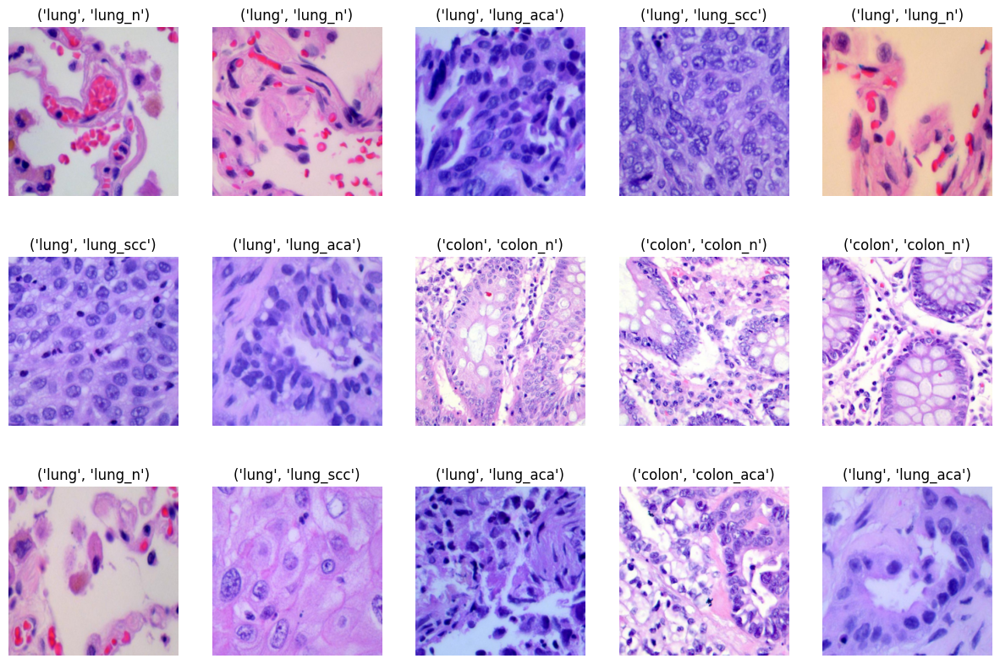

In [ ]:
fig, axis = plt.subplots(3, 5, figsize=(15, 10))
for i, ax in enumerate(axis.flat):
    with torch.no_grad():
        img = trainimage_sample[i].numpy()
        img = np.transpose(img, (1, 2, 0))
        ax.imshow(img)
        ax.set(title = f"{getlabel(trainlabel_sample[i])}")
        ax.axis('off')

In [ ]:
def param_count(model):
    params = [p.numel() for p in model.parameters() if p.requires_grad]
    print('Total number of parameters : ', sum(params))

# Building the model

In [ ]:
class CNN(nn.Module) :
    def __init__(self,input_shape , output) :
        super().__init__()
        self.block1=nn.Sequential(nn.Conv2d(in_channels=input_shape ,out_channels=32 ,kernel_size=(3,3) ,stride=2 ,padding = 1) ,
            nn.ReLU() ,
            nn.Conv2d(in_channels=32 ,out_channels=64 ,kernel_size=(3,3) ,stride=2 ,padding=1) ,
            nn.ReLU() ,
            nn.MaxPool2d(kernel_size=2))

        self.block2=nn.Sequential(
            nn.Conv2d(in_channels=64 ,out_channels=128 ,kernel_size=(3,3) ,stride = 2 ,padding = 1) ,
            nn.ReLU() ,
            nn.Conv2d(in_channels=128 ,out_channels=256 ,kernel_size = (3,3) ,stride = 2 ,padding = 1) ,
            nn.ReLU() ,
            nn.MaxPool2d(kernel_size=2))

        self.fully_connected_layer=nn.Sequential(
            nn.Flatten() ,
            nn.Linear(in_features=256*4*4, out_features=output))


    def forward(self,x) :
        x=self.block1(x)   #This step extracts initial features from the input image
        x=self.block2(x)   #similar operations as block1 further extracting and refining features
        x=self.fully_connected_layer(x)   #This layer maps the extracted features to the output classes
        return x

In [ ]:
#initializing the CNN model

torch.manual_seed(42)
model=CNN(
    input_shape = 3 ,
    output=len(classes)
)

In [ ]:
model.parameters

<bound method Module.parameters of CNN(
  (block1): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU()
    (2): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU()
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (block2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU()
    (2): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU()
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (fully_connected_layer): Sequential(
    (0): Flatten(start_dim=1, end_dim=-1)
    (1): Linear(in_features=4096, out_features=5, bias=True)
  )
)>

In [ ]:
param_count(model)

Total number of parameters :  408901


In [ ]:
criterion=nn.CrossEntropyLoss()
optimizer=Adam(model.parameters(),lr=0.001)

# Training the model

In [ ]:
epochs=10 #"epochs" stores the total number of times the entire training dataset will be passed through the model during training.
training_acc=[]
training_loss=[] # "training_acc" and "training_loss" are initialized to store the training accuracy and loss for each epoch.
for i in tqdm(range(epochs)) :
    epoch_loss=0
    correct=0
    total=0
    for batch , (x_train , y_train) in enumerate(train_dataloader) :    #Iterates through each batch of data from the training dataloader
        y_pred=model.forward(x_train)
        loss=criterion(y_pred,y_train)

        if batch % 50 == 0:       #Prints a progress message every 50 batches
            print(f"Looked at {batch * len(x_train)}/{len(train_dataloader.dataset)} samples.")

        loss.backward()    #Computes the gradients of the loss with respect to the model's parameters
        optimizer.step()     #Updates the model's parameters based on the computed gradients
        optimizer.zero_grad() #Resets the gradients to zero before the next batch

        epoch_loss+=loss #The loss for the current mini-batch is added to "epoch_loss."

        _,pred = torch.max(y_pred,dim=1)
        correct = correct + torch.sum(pred == y_train).item()
        total += y_train.size(0)

    training_loss.append((epoch_loss/len(train_dataloader)).detach().numpy())    #After each epoch the average loss and accuracy for the epoch are calculated and stored in the respective lists
    training_acc.append(100 * correct / total)
    print(f"Epoch {i}: Accuracy: {100 * correct/total}, Loss: {(epoch_loss/len(train_dataloader))}")

  0%|          | 0/10 [00:00<?, ?it/s]

Looked at 0/20000 samples.
Looked at 6400/20000 samples.
Looked at 12800/20000 samples.
Looked at 19200/20000 samples.


 10%|█         | 1/10 [13:14<1:59:09, 794.37s/it]

Epoch 0: Accuracy: 72.275, Loss: 0.6196540594100952
Looked at 0/20000 samples.
Looked at 6400/20000 samples.
Looked at 12800/20000 samples.
Looked at 19200/20000 samples.


 20%|██        | 2/10 [20:40<1:18:37, 589.73s/it]

Epoch 1: Accuracy: 85.595, Loss: 0.339774489402771
Looked at 0/20000 samples.
Looked at 6400/20000 samples.
Looked at 12800/20000 samples.
Looked at 19200/20000 samples.


 30%|███       | 3/10 [27:54<1:00:28, 518.33s/it]

Epoch 2: Accuracy: 89.85, Loss: 0.2528999447822571
Looked at 0/20000 samples.
Looked at 6400/20000 samples.
Looked at 12800/20000 samples.
Looked at 19200/20000 samples.


 40%|████      | 4/10 [36:39<52:06, 521.16s/it]  

Epoch 3: Accuracy: 92.465, Loss: 0.1891554743051529
Looked at 0/20000 samples.


In [ ]:
print(f"The loss of the training set is : {training_loss[-1]}")
print(f"The accuracy of the training set is : {training_acc[-1]}%")

The loss of the training set is : 0.00024410417245235294
The accuracy of the training set is : 100.0%


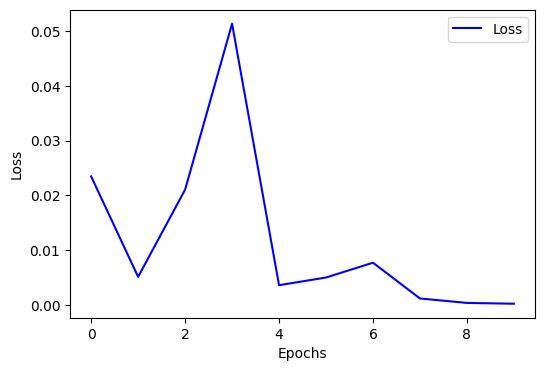

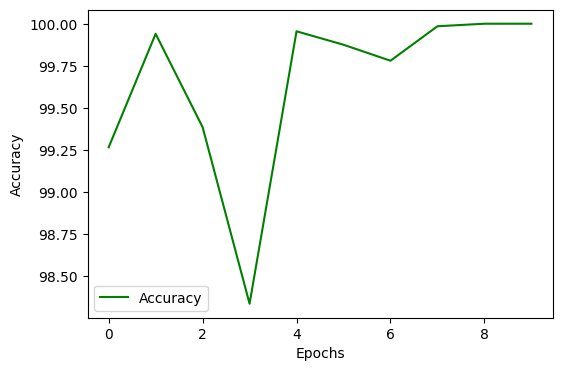

In [ ]:
plt.subplots(figsize=(6,4))
plt.plot(range(epochs),training_loss,color="blue",label="Loss")
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

plt.subplots(figsize=(6,4))
plt.plot(range(epochs),training_acc,color="green",label="Accuracy")
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Model Evaluation

In [ ]:
test_loss=0
test_acc= 0
torch.manual_seed(42)
with torch.no_grad() :
        for x_test , y_test in test_dataloader :
            y_pred=model.forward(x_test)
            loss=criterion(y_pred,y_test)
            test_loss+=loss
            test_acc += accuracy_score(y_test , y_pred.argmax(dim=1))
test_loss/=len(test_dataloader)
test_acc/=len(test_dataloader)

In [ ]:
print(f"The loss of the testing set is : {test_loss}\n")
print(f"The accuracy of the testing set is : {test_acc*100}%\n")

The loss of the testing set is : 0.05348639562726021

The accuracy of the testing set is : 98.53515625%



# Show predictions

In [ ]:
y_preds=[]
x_test_samples=[]
y_test_samples=[]
torch.manual_seed(42)
with torch.no_grad() :
    for x_test , y_test in test_dataloader :
        x_test_samples.append(x_test)
        y_test_samples.append(y_test.detach().numpy())
        y_pred=model.forward(x_test)
        y_preds.append(y_pred.detach().numpy())

In [ ]:
y_preds=np.array(y_preds)
x_test_samples=np.array(x_test_samples)
y_test_samples=np.array(y_test_samples)

ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (40,) + inhomogeneous part.

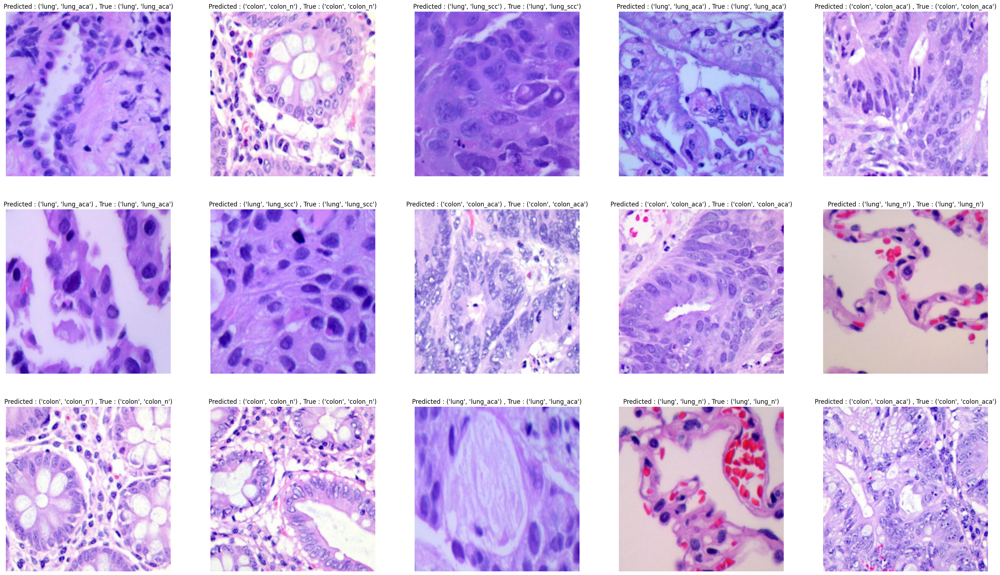

In [ ]:
fig, axis = plt.subplots(3, 5, figsize=(35, 20))
for i, ax in enumerate(axis.flat):
    with torch.no_grad():
        img = x_test_samples[0][i].numpy()
        img = np.transpose(img, (1, 2, 0))
        ax.imshow(img)
        ax.set(title = f"Predicted : {getlabel(y_preds[0][i].argmax())} , True : {getlabel(y_test_samples[0][i])}")
        ax.axis('off')